In [1]:
%load_ext autoreload
%autoreload 2
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:96% !important; }</style>"))

import os
import torch
import matplotlib.pyplot as plt
from skimage.io import imread
import torch.nn as nn
import numpy as np
from skimage import img_as_ubyte
import imageio
import json
import cv2
import time
from PIL import Image
from pytorch3d.loss import (
    mesh_laplacian_smoothing, 
    mesh_normal_consistency,
)
from torch.optim.lr_scheduler import ReduceLROnPlateau

import torch.nn.functional as F

from tqdm import tqdm_notebook
# Util function for loading meshes
from pytorch3d.io import load_objs_as_meshes, load_obj
import math
# Data structures and functions for rendering
from pytorch3d.structures import Meshes, Textures, join_meshes_as_batch
from pytorch3d.renderer import (
    look_at_view_transform,
    OpenGLPerspectiveCameras, 
    SfMPerspectiveCameras,
    SfMOrthographicCameras,
    PointLights, 
    BlendParams,
    DirectionalLights,
    Materials, 
    RasterizationSettings, 
    MeshRenderer, 
    MeshRasterizer,  
    TexturedSoftPhongShader,
    SoftSilhouetteShader,
    look_at_rotation,
    HardFlatShader
)

# add path for demo utils functions 
import sys
import os
import glob
sys.path.append(os.path.abspath(''))

print(torch.version.cuda)
from datetime import datetime
def now_str():
    now = datetime.now()
    month = str(now.month)
    day = str(now.day)
    hour = str(now.hour)
    minute = str(now.minute)
    sec = str(now.second)
    
    output = '[{:>02}/{:>02} {:>02}:{:>02}:{:>02}]'.format(month, day, hour, minute, sec)
    return output
def __output_log(path, strs):
    if not os.path.exists(path):
        with open(path, 'w+') as f:
            f.write(strs)
            f.close()
    else:
        with open(path, 'a+') as f:
            f.write(strs)
            f.close()
print(now_str())
print(torch.__version__)

9.2
[06/07 21:10:12]
1.4.0


In [2]:
#in_dir = './14g_data/output/200528'
#img_names = ['03052', '03067', '04917', '06250', '06550']

in_dir = r'D:\1_Projects\200325_PyTorch3d_Projects\14g_data\output\200607'
img_names = ['03052', '03067', '04917', '06250', '06550']
cam_indices = list(range(16))

In [81]:
tex_counts = {}
tex_sums = {}
tex_average = {}
tex_variance = {}
for img_name in img_names:
    tex_count = np.zeros((1024, 1024)).astype(np.uint8)
    tex_sum = np.zeros((1024, 1024)).astype(np.float32)
    for cam_idx in cam_indices:
        in_path = in_dir + '/{}/{}/texturemap.npy'.format(img_name, cam_idx)
        tex_np = np.load(in_path).squeeze()
        tex_count += np.where(tex_np > 0.0, 1, 0).astype(np.uint8)
        tex_sum += np.where(tex_np > 0.0, tex_np, 0)
    print(in_path,':', tex_np.shape)
    tex_counts[img_name] = tex_count.astype(np.float32)
    tex_sums[img_name] = tex_sum.astype(np.float32)
    tex_avg = tex_sum / (tex_count + 1e-8)
#     channel_max = np.max(np.max(tex_avg, axis=0), axis=0)
#     channel_min = np.min(np.min(tex_avg, axis=0), axis=0)
#     tex_avg = (tex_avg - channel_min)/(channel_max - channel_min)
    tex_average[img_name] = tex_avg.astype(np.float32)
    print('  {} | {} | mean ({:.2f}, {:.2f})'.format(tex_avg.shape, tex_avg.dtype, np.min(tex_avg), np.max(tex_avg)))
    
# variance after average value is obtained
for img_name in img_names:
    tex_var = np.zeros((1024, 1024)).astype(np.float32)
    tex_avg = tex_average[img_name]
    for cam_idx in cam_indices:
        in_path = in_dir + '/{}/{}/texturemap.npy'.format(img_name, cam_idx)
        tex_np = np.load(in_path).squeeze()
        tex_var += np.where(tex_np > 0.0, (tex_np-tex_avg)**2, 0.0)

    tex_count = tex_counts[img_name]
    tex_var /= (tex_count + 1e-8)

    tex_variance[img_name] = tex_var
    print('  [{}] variance: ({:.2f}, {:.2f})'.format(img_name, np.min(tex_var), np.max(tex_var)))

D:\1_Projects\200325_PyTorch3d_Projects\14g_data\output\200607/03052/15/texturemap.npy : (1024, 1024)
  (1024, 1024) | float64 | mean (0.00, 2.07)
D:\1_Projects\200325_PyTorch3d_Projects\14g_data\output\200607/03067/15/texturemap.npy : (1024, 1024)
  (1024, 1024) | float64 | mean (0.00, 2.01)
D:\1_Projects\200325_PyTorch3d_Projects\14g_data\output\200607/04917/15/texturemap.npy : (1024, 1024)
  (1024, 1024) | float64 | mean (0.00, 2.12)
D:\1_Projects\200325_PyTorch3d_Projects\14g_data\output\200607/06250/15/texturemap.npy : (1024, 1024)
  (1024, 1024) | float64 | mean (0.00, 2.18)
D:\1_Projects\200325_PyTorch3d_Projects\14g_data\output\200607/06550/15/texturemap.npy : (1024, 1024)
  (1024, 1024) | float64 | mean (0.00, 2.18)
  [03052] variance: (0.00, 2.93)
  [03067] variance: (0.00, 1.93)
  [04917] variance: (0.00, 1.79)
  [06250] variance: (0.00, 1.27)
  [06550] variance: (0.00, 2.36)


In [74]:
print(tex_average.keys())

dict_keys([])


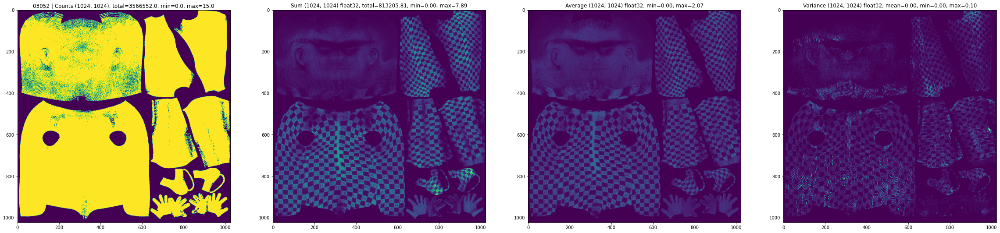

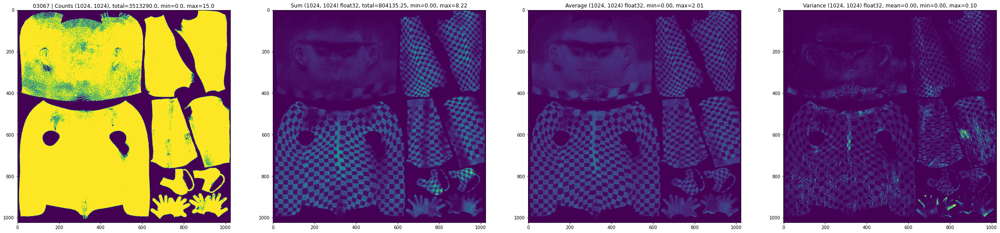

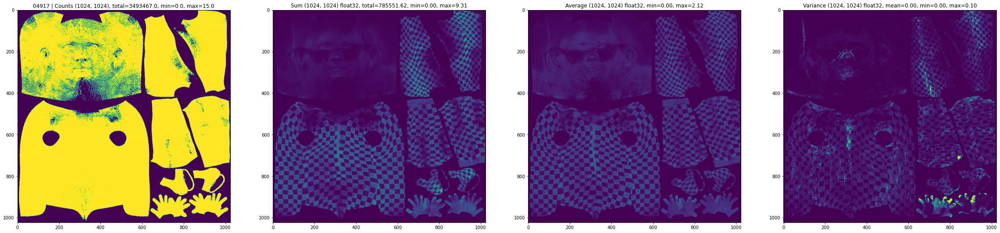

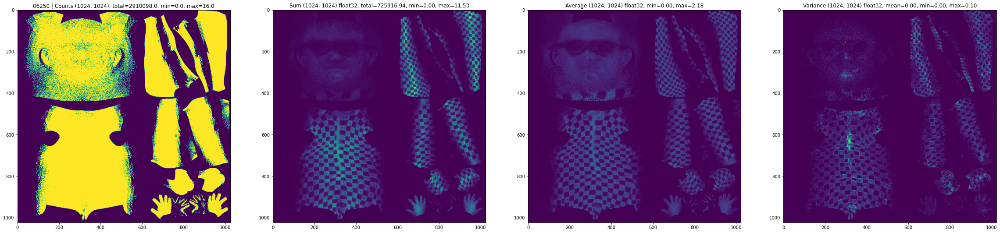

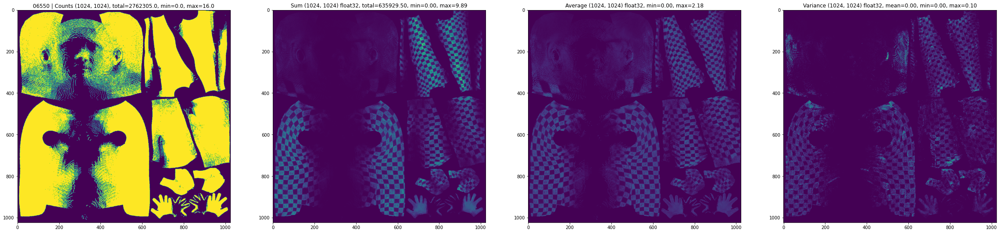

In [78]:
for img_name, tex_c in tex_counts.items():
    fig, ax = plt.subplots(1, 4, figsize=(40, 10))
    
    tex_c_binary = tex_c > 0
    ax[0].set_title('{} | Counts {}, total={}, min={}, max={}'.format(img_name, tex_c.shape, np.sum(tex_c), np.min(tex_c), np.max(tex_c)))
    ax[0].imshow(tex_c_binary)

    tex_s = tex_sums[img_name]
    ax[1].imshow(tex_s)
    ax[1].set_title('Sum {} {}, total={:.2f}, min={:.2f}, max={:.2f}'.format(tex_s.shape, tex_s.dtype, np.sum(tex_s), np.min(tex_s), np.max(tex_s)))

    tex_a = tex_average[img_name]
    ax[2].imshow(tex_a)
    ax[2].set_title('Average {} {}, min={:.2f}, max={:.2f}'.format(tex_a.shape, tex_a.dtype, np.min(tex_a), np.max(tex_a)))
    
    tex_v = tex_variance[img_name]
    tex_v = np.clip(tex_v, a_min=np.min(tex_v), a_max=0.1)
    ax[3].imshow(tex_v, vmin=np.min(tex_v), vmax=np.max(tex_v))
    ax[3].set_title('Variance {} {}, mean={:.2f}, min={:.2f}, max={:.2f}'.format(tex_v.shape, tex_v.dtype, np.mean(tex_v), np.min(tex_v), np.max(tex_v)))
    plt.show()

# Average using inverse-variance weights

In [97]:
tex_final = np.zeros((1024, 1024)).astype(np.float32)
tex_final_naive_avg = np.zeros((1024, 1024)).astype(np.float32)
tex_counts_final = np.zeros((1024, 1024)).astype(np.float32)

var_sum = 0
for img_name in img_names:
    counts = tex_counts[img_name]
    y = tex_average[img_name]
    var = tex_variance[img_name]
    print(y.shape, y.dtype, var.shape, var.dtype)
    tex_final += np.where(counts > 0, (y / (var + 1e-8)), 0)
    var_sum += np.where(counts > 0, (1 / (var + 1e-8)), 1)
    tex_final_naive_avg += y
    tex_counts_final += counts.astype(np.float32)
tex_final_naive_avg /= len(img_names)
tex_final /= var_sum

#tex_final = (tex_final - np.min(tex_final)) / (np.max(tex_final) - np.min(tex_final))
tex_final = np.clip(tex_final, a_min=0, a_max=1)
print(tex_final.shape)

(1024, 1024) float32 (1024, 1024) float32
(1024, 1024) float32 (1024, 1024) float32
(1024, 1024) float32 (1024, 1024) float32
(1024, 1024) float32 (1024, 1024) float32
(1024, 1024) float32 (1024, 1024) float32
(1024, 1024)


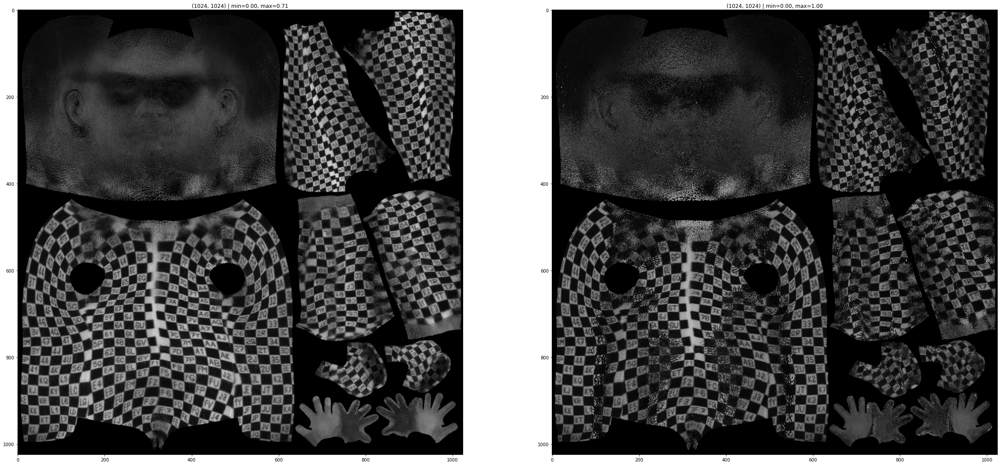

In [98]:
fig, ax = plt.subplots(1, 2, figsize=(40, 20))
ax[0].imshow(tex_final_naive_avg, cmap='gray')
ax[0].set_title('{} | min={:.2f}, max={:.2f}'.format(tex_final_naive_avg.shape, np.min(tex_final_naive_avg), np.max(tex_final_naive_avg)))

ax[1].imshow(tex_final, cmap='gray')
ax[1].set_title('{} | min={:.2f}, max={:.2f}'.format(tex_final.shape, np.min(tex_final), np.max(tex_final)))
plt.show()